# SSDLite MobileNetv2

The used implementation of single shot detector is SSDLite-MobileNetv2.

### What is MobileNetV2?
MobileNetV2 is a convolutional neural network architecture that is designed to be more efficient and faster in processing image data. It is an improved version of the original MobileNet, with an improved structure for the convolutional kernels, and more effective regularization techniques.
You can check more details at [Arxiv.org](https://arxiv.org/abs/1801.04381)

### How SSDLite-MobileNetv2 is different from SSD?
SSD Lite Mobilenetv2 is a single-shot object detector that combines the Mobilenetv2 architecture with the SSD (Single Shot MultiBox Detector) architecture. The goal of SSD is to generate a fixed number of predictions (boxes) per image, rather than predicting bounding boxes on a per-pixel basis like in Faster R-CNN. The "Lite" in the name refers to a lightweight implementation of the SSD architecture that has a reduced number of layers and filters, making it more computationally efficient.

On the other hand, SSD Mobilenetv2 is another implementation of SSD using the Mobilenetv2 architecture. However, unlike SSD Lite Mobilenetv2, SSD Mobilenetv2 uses a larger and more complex architecture.

In terms of speed and accuracy, SSD Lite Mobilenetv2 generally outperforms SSD Mobilenetv2. This is because the lightweight implementation in SSD Lite Mobilenetv2 can be faster, especially on mobile devices where processing power is limited. However, the larger and more complex architecture in SSD Mobilenetv2 can potentially yield higher accuracy.


# -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- --
## Training setup

### 1. GPU memory usage
Run this code lines to check CUDA and GPU memory availabilty

In [2]:
!nvidia-smi

Thu Oct 12 10:34:55 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.12             Driver Version: 535.104.12   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA RTX A6000               On  | 00000000:19:00.0 Off |                  Off |
| 30%   39C    P8              27W / 300W |   7677MiB / 49140MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
# Check CUDA compiler
!nvcc -V

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0


### <em>Optional</em>
If you'd like to use a base a pretrained SSD model, you can uncomment the following line code. Once Downloaded change `load_from` variable in the config file [ssd_hrplanesv2.py](./mmlab_configs/ssd_hrplanesv2.py) from `None` to the path of the downloaded `.pth`

In [ ]:
# !mim download mmdet --config ssdlite_mobilenetv2-scratch_8xb24-600e_coco --dest mmlab_configs

### Dataset check
1. Check if the dataset is available in the specified path
2. Verify that you dataset is in coco format
3. If not, you can use `Yolo-to-COCO-format-converter\`

    <em>SOURCE: [Taeyoung96/Yolo-to-COCO-format-converter](https://github.com/Taeyoung96/Yolo-to-COCO-format-converter)</em>

4. Modify the config file ssd_hrplanesv2.py:

    ```data_root = ABSOLUTE/PATH/TO/COCO/DATASET ```

5. Depending on you hardware setup, you can also change `batch_size` and
`max_epochs` variables
    

In [11]:
import os

def check_data_folder():
    home = os.getcwd()
    data_folder = home + '/data'
    if os.path.exists(data_folder) and os.path.isdir(data_folder):
        print("The data folder exists.")
    else:
        print("The data folder does not exist.")

check_data_folder()

The data folder exists.


### Start training

you can start training SSD using this command

In [ ]:
!python train.py mmlab_configs/ssd_hrplanesv2.py

### Wait until the training finishes
if the training takes too long you can use in the terminal the command:

 ```nohup python mmdetection/tools/train.py mmlab_configs/ssd_hrplanesv2.py > ssd_hrplanesv2.log &```

### Inference
To run the inference, execute the following command

In [6]:
!python image_inference.py inference_test/unseen output_tensor/ssd/ssd_hrplanesv2.py --weights output_tensor/ssd/best.pth --out-dir inference_test/results/ssd_inference --pred-score-thr 0.3

Loads checkpoint by local backend from path: output_tensor/ssd/best.pth
01/06 13:28:45 - mmengine - WARNING - Failed to search registry with scope "mmdet" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmdet" is a correct scope, or whether the registry is initialized.
01/06 13:28:45 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
/home/safouane/.local/lib/python3.8/site-packages/mmengine/visualization/visuali━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1 it/s  
zer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may 
not be in the image
  warnings.warn(
/home/safouane/.local/lib/python3.8/site-packages/mmengine/visualization/visualim━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1 it/s  
zer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn 
polygon may not be 

### Let's plot the results

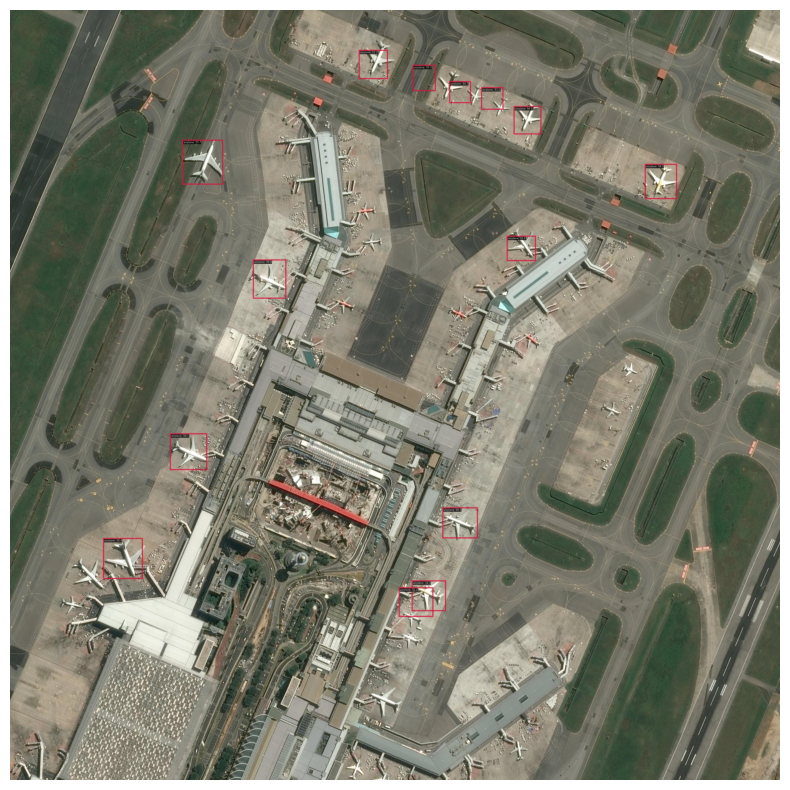

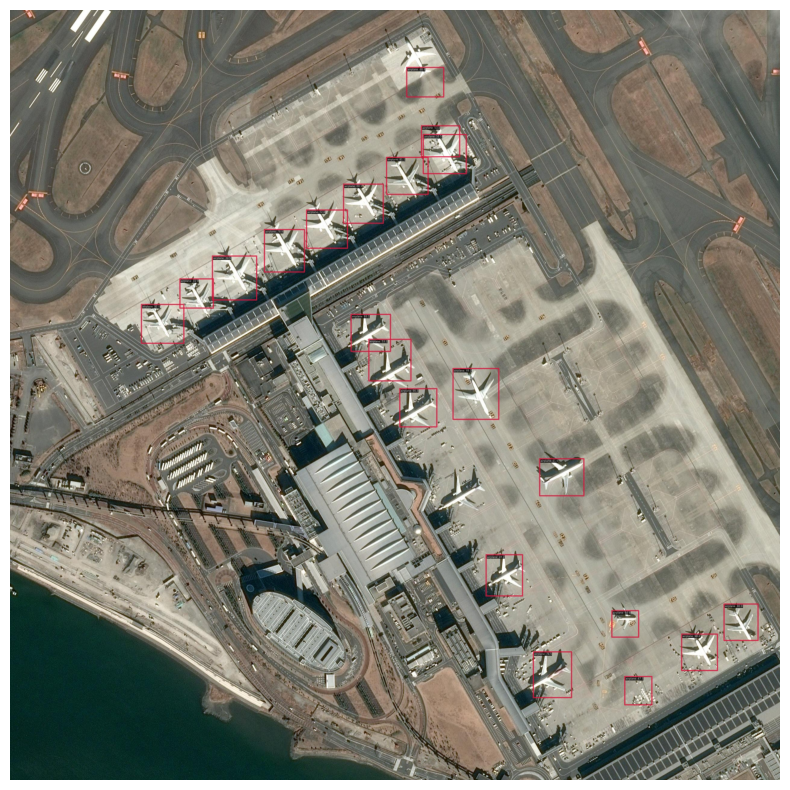

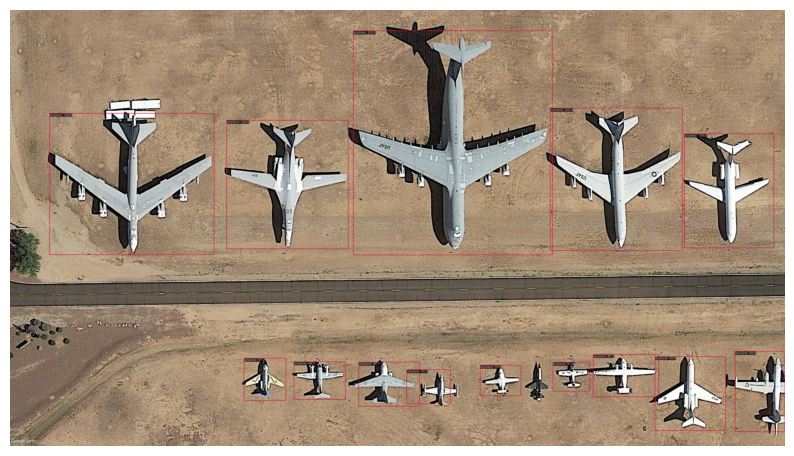

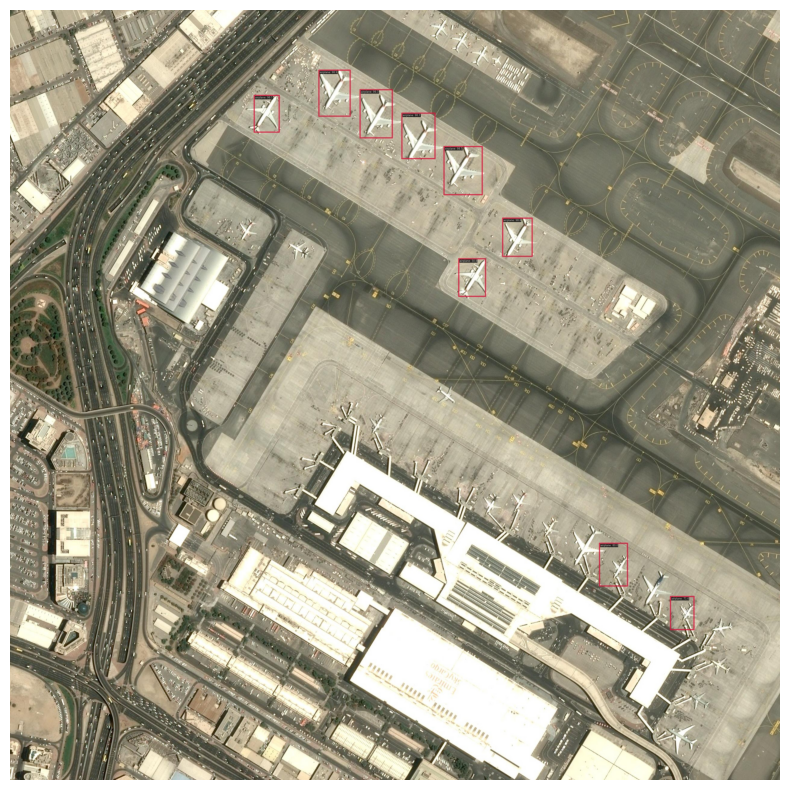

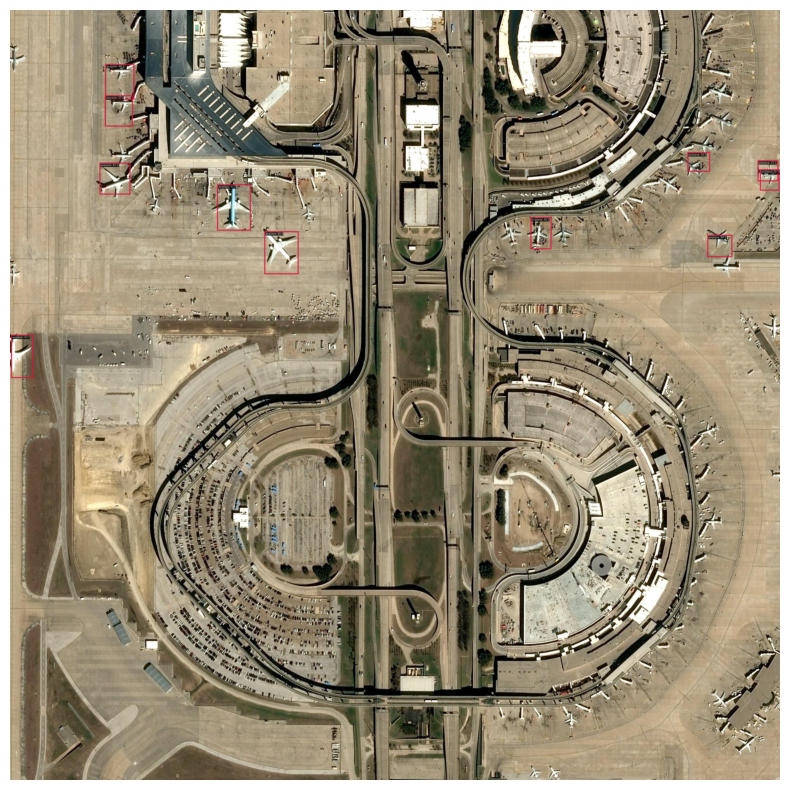

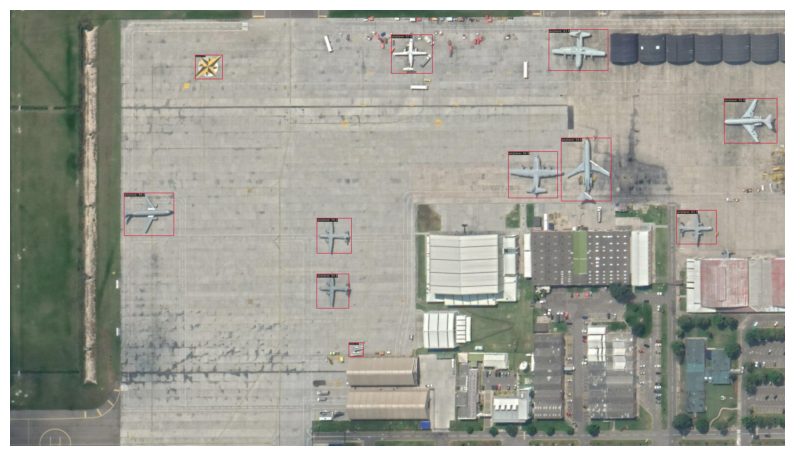

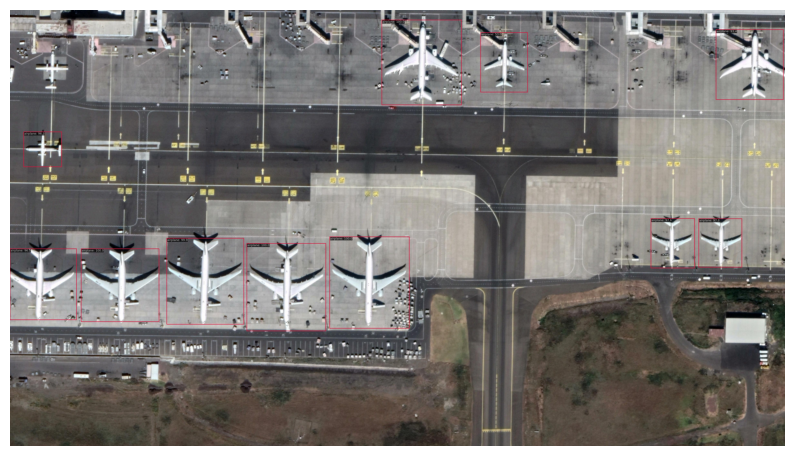

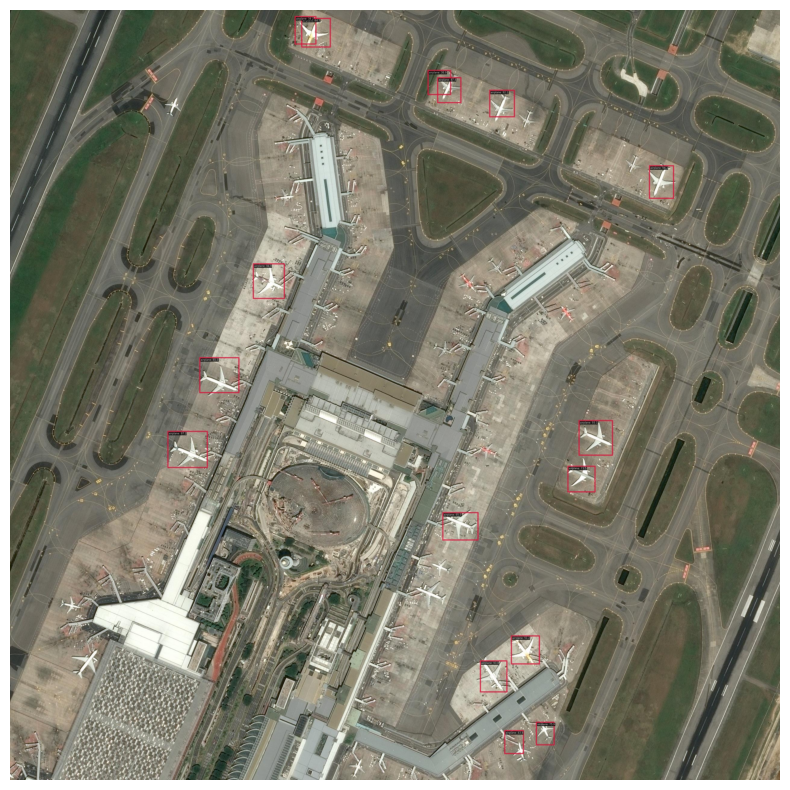

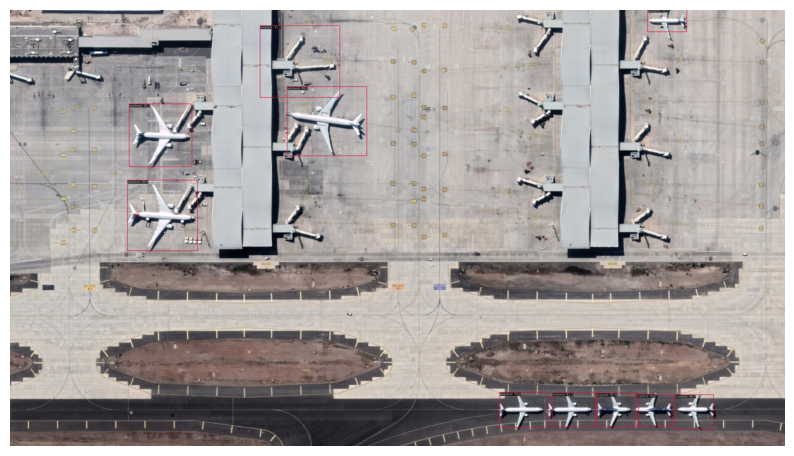

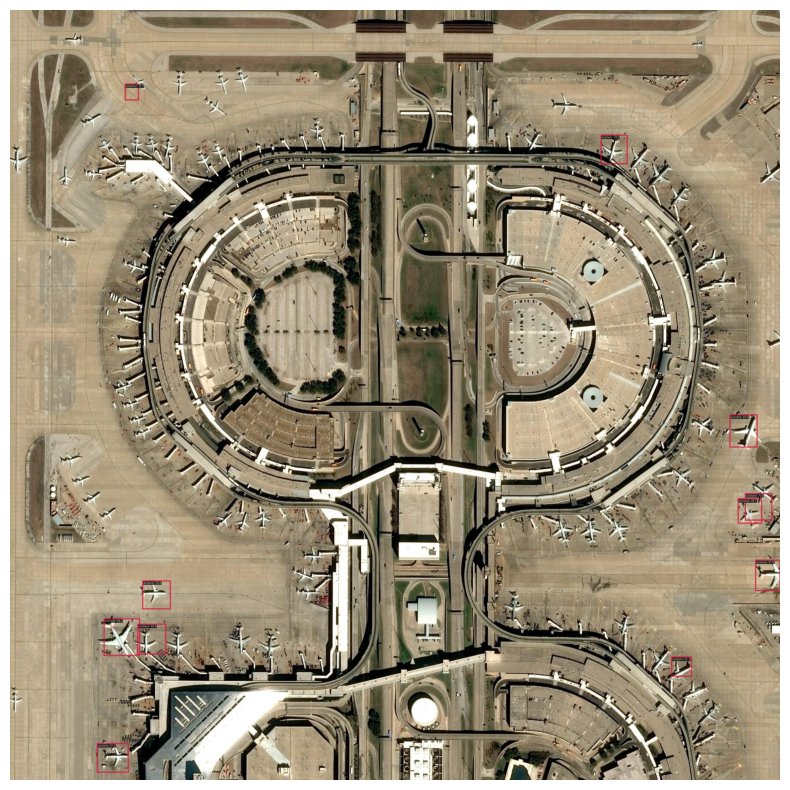

In [5]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define the path to the directory containing the jpg images
path_to_images = './inference_test/results/ssd_inference/vis'

# Iterate over each file in the directory
for file in os.listdir(path_to_images):
    # Check if the file is a jpg image
    if file.endswith('.jpg'):
        # Open the image using PIL
        img = Image.open(os.path.join(path_to_images, file))

        # Convert the image to an RGB format that matplotlib can understand
        img_rgb = img.convert('RGB')

        # Display the image using matplotlib
        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.axis('off')
        plt.show()